In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import sentence_transformers
from sklearn.metrics import silhouette_score
import sys
from pathlib import Path
sys.path.append(str(Path("..").resolve()))
from db.database import Database
from util.dataframe_utils import get_dataframes

In [2]:
db = Database()
bp_df, topics_df, posts_df = get_dataframes(db)
bp_df.head()

,blueprint_url,blueprint_code,post_id,description,topic_keywords,keywords_tfidf,id,blueprint_hash,name,extracted_keywords,keywords_yake,topic_title,topic_id,tags,created_at,post_content,processed_keywords
0,https://community.home-assistant.io//t/nag-pro...,blueprint:\n name: Nag prompt blueprint\n de...,1220860,Nag a mobile device to do something,"{""android"": 0.04282333988128355, ""user"": 0.042...","{""nag"": 0.6591492709484212, ""prompt"": 0.237436...",1,2f523787adf856fbddd08b2f7b32aa2490eb48a236bc68...,Nag prompt blueprint,"{""input__input_boolean"": 2}","[""android notification"", ""nag prompt"", ""nag no...",Nag prompt Blueprint (Android Notification),255041,[],2020-12-14 01:40:32.358,<p>This blueprints creates configurable nag no...,"[""boolean""]"
1,https://community.home-assistant.io//t/inovell...,blueprint:\n name: Inovelli \n description: ...,1220678,Use this blueprint to create automations based...,"{""inovelli"": 0.027025502281732554, ""create"": 0...","{""inovelli"": 0.49285018857218027, ""lzw36"": 0.4...",2,ca6a74b04fac9cee0925adfe7cb03c8beb0354a816fa66...,Inovelli,{},"[""fan"", ""inovelli"", ""create"", ""dimmer""]",Inovelli LZW36 Fan/Dimmer Scenes,254999,"[""blueprint""]",2020-12-13 22:32:38.158,<p>This blueprint allows you to easily create ...,null
2,https://community.home-assistant.io//t/deconz-...,blueprint:\n name: deCONZ - IKEA five button ...,1223455,Control anything using IKEA five button remote\n,"{""short"": 0.01649244354775234, ""long"": 0.01649...","{""button"": 0.4699242472830788, ""five"": 0.35503...",3,c5f67655e23dff66b1042d3b38e967d74dad01a4a3d589...,deCONZ - IKEA five button remote,"{""input__deconz"": 1}","[""button short"", ""button remote"", ""long press""...",deCONZ - IKEA five button remote,255699,"[""switch"", ""blueprint"", ""deconz""]",2020-12-15 12:18:15.898,"<p>This is a mix of <a href=""https://community...","[""deconz""]"
3,https://community.home-assistant.io//t/set-hea...,blueprint:\n name: Heat for certain time\n d...,1223628,Turn on heating for a given amount of time.,"{""set"": 0.055741499059047184, ""temperature"": 0...","{""heat"": 0.34881772060990424, ""heating"": 0.334...",4,00b1c4d2e847ed9451c8e8d1acfbbcd5e1740f9991226d...,Heat for certain time,"{""input__input_datetime"": 1, ""input__climate"": 2}","[""set heating"", ""heating temperature"", ""time"",...",Set heating temperature to a configurable valu...,255742,[],2020-12-15 14:23:53.414,"<p>This is a blueprint, that allows to set the...","[""datetime"", ""climate""]"
4,https://community.home-assistant.io//t/light-a...,blueprint:\n name: Light Allowance\n descrip...,1224871,Turns a light off after an allotted time,"{""time"": 0.11369206228658875, ""light"": 0.13453...","{""allotted"": 0.6327468890387052, ""allowance"": ...",5,0dd0ec70d42f2e8a428ae7a2934852dbec0beb34cd03cc...,Light Allowance,"{""input__light"": 1, ""output__light"": 1}","[""light allowance"", ""light"", ""allowance"", ""all...",Light Allowance,256045,[],2020-12-16 04:23:36.519,<p>This blueprint will turn a light off after ...,"[""light"", ""light""]"


In [3]:
import json, re
def process_bp_keywords(kwd_dict: dict[str, int] | str) -> list[str] | None:
    if isinstance(kwd_dict, str):
        kwd_dict = json.loads(kwd_dict)
    
    kwd_list = list(kwd_dict.keys())
    if kwd_list.__len__() < 1:
        return None
    
    kwds = []
    
    for kwd in kwd_list:
        in_out = re.search(r"(input__|output__)(input_|output_)?", kwd)
        kwd = kwd.removeprefix(in_out.group()) if in_out else kwd
        in_out = in_out.group(1) if in_out else None
        kwds.append(in_out + kwd if in_out else kwd)
    return kwds

In [4]:
ignorable_tags = {"blueprint", "automation"}
bp_df["tags"] = bp_df["tags"].apply(lambda tags: [tag for tag in json.loads(tags) if tag not in ignorable_tags])
bp_df.head()

,blueprint_url,blueprint_code,post_id,description,topic_keywords,keywords_tfidf,id,blueprint_hash,name,extracted_keywords,keywords_yake,topic_title,topic_id,tags,created_at,post_content,processed_keywords
0,https://community.home-assistant.io//t/nag-pro...,blueprint:\n name: Nag prompt blueprint\n de...,1220860,Nag a mobile device to do something,"{""android"": 0.04282333988128355, ""user"": 0.042...","{""nag"": 0.6591492709484212, ""prompt"": 0.237436...",1,2f523787adf856fbddd08b2f7b32aa2490eb48a236bc68...,Nag prompt blueprint,"{""input__input_boolean"": 2}","[""android notification"", ""nag prompt"", ""nag no...",Nag prompt Blueprint (Android Notification),255041,[],2020-12-14 01:40:32.358,<p>This blueprints creates configurable nag no...,"[""boolean""]"
1,https://community.home-assistant.io//t/inovell...,blueprint:\n name: Inovelli \n description: ...,1220678,Use this blueprint to create automations based...,"{""inovelli"": 0.027025502281732554, ""create"": 0...","{""inovelli"": 0.49285018857218027, ""lzw36"": 0.4...",2,ca6a74b04fac9cee0925adfe7cb03c8beb0354a816fa66...,Inovelli,{},"[""fan"", ""inovelli"", ""create"", ""dimmer""]",Inovelli LZW36 Fan/Dimmer Scenes,254999,[],2020-12-13 22:32:38.158,<p>This blueprint allows you to easily create ...,null
2,https://community.home-assistant.io//t/deconz-...,blueprint:\n name: deCONZ - IKEA five button ...,1223455,Control anything using IKEA five button remote\n,"{""short"": 0.01649244354775234, ""long"": 0.01649...","{""button"": 0.4699242472830788, ""five"": 0.35503...",3,c5f67655e23dff66b1042d3b38e967d74dad01a4a3d589...,deCONZ - IKEA five button remote,"{""input__deconz"": 1}","[""button short"", ""button remote"", ""long press""...",deCONZ - IKEA five button remote,255699,"[switch, deconz]",2020-12-15 12:18:15.898,"<p>This is a mix of <a href=""https://community...","[""deconz""]"
3,https://community.home-assistant.io//t/set-hea...,blueprint:\n name: Heat for certain time\n d...,1223628,Turn on heating for a given amount of time.,"{""set"": 0.055741499059047184, ""temperature"": 0...","{""heat"": 0.34881772060990424, ""heating"": 0.334...",4,00b1c4d2e847ed9451c8e8d1acfbbcd5e1740f9991226d...,Heat for certain time,"{""input__input_datetime"": 1, ""input__climate"": 2}","[""set heating"", ""heating temperature"", ""time"",...",Set heating temperature to a configurable valu...,255742,[],2020-12-15 14:23:53.414,"<p>This is a blueprint, that allows to set the...","[""datetime"", ""climate""]"
4,https://community.home-assistant.io//t/light-a...,blueprint:\n name: Light Allowance\n descrip...,1224871,Turns a light off after an allotted time,"{""time"": 0.11369206228658875, ""light"": 0.13453...","{""allotted"": 0.6327468890387052, ""allowance"": ...",5,0dd0ec70d42f2e8a428ae7a2934852dbec0beb34cd03cc...,Light Allowance,"{""input__light"": 1, ""output__light"": 1}","[""light allowance"", ""light"", ""allowance"", ""all...",Light Allowance,256045,[],2020-12-16 04:23:36.519,<p>This blueprint will turn a light off after ...,"[""light"", ""light""]"


In [5]:
max_keywords = bp_df["extracted_keywords"].apply(lambda x: len(json.loads(x)) if isinstance(x, str) else 0).max() 
max_tags = bp_df["tags"].apply(lambda x: len(x) if isinstance(x, list) else 0).max()
max_yake = 4
max_features = max_keywords + max_tags + max_yake
max_keywords, max_tags, max_features

(15, 5, 24)

In [6]:
def extract_features(row, max_features=max_features):
    padding = "<PAD>"
    
    yake_features = json.loads(row["keywords_yake"])
    combined_features = list(yake_features)
    ext_kw = process_bp_keywords(row["extracted_keywords"])
    if ext_kw:
        combined_features.extend(ext_kw)
    
    kw_n = max_keywords - len(ext_kw) if ext_kw else max_keywords
    combined_features += [padding] * kw_n
    
    tags = row["tags"]
    tag_n = max_tags - len(tags)
    combined_features.extend(tags)
    combined_features += [padding] * tag_n

    return combined_features

In [7]:
bp_df["features"] = bp_df.apply(extract_features, axis=1)
bp_df.head()

,blueprint_url,blueprint_code,post_id,description,topic_keywords,keywords_tfidf,id,blueprint_hash,name,extracted_keywords,keywords_yake,topic_title,topic_id,tags,created_at,post_content,processed_keywords,features
0,https://community.home-assistant.io//t/nag-pro...,blueprint:\n name: Nag prompt blueprint\n de...,1220860,Nag a mobile device to do something,"{""android"": 0.04282333988128355, ""user"": 0.042...","{""nag"": 0.6591492709484212, ""prompt"": 0.237436...",1,2f523787adf856fbddd08b2f7b32aa2490eb48a236bc68...,Nag prompt blueprint,"{""input__input_boolean"": 2}","[""android notification"", ""nag prompt"", ""nag no...",Nag prompt Blueprint (Android Notification),255041,[],2020-12-14 01:40:32.358,<p>This blueprints creates configurable nag no...,"[""boolean""]","[android notification, nag prompt, nag notific..."
1,https://community.home-assistant.io//t/inovell...,blueprint:\n name: Inovelli \n description: ...,1220678,Use this blueprint to create automations based...,"{""inovelli"": 0.027025502281732554, ""create"": 0...","{""inovelli"": 0.49285018857218027, ""lzw36"": 0.4...",2,ca6a74b04fac9cee0925adfe7cb03c8beb0354a816fa66...,Inovelli,{},"[""fan"", ""inovelli"", ""create"", ""dimmer""]",Inovelli LZW36 Fan/Dimmer Scenes,254999,[],2020-12-13 22:32:38.158,<p>This blueprint allows you to easily create ...,null,"[fan, inovelli, create, dimmer, <PAD>, <PAD>, ..."
2,https://community.home-assistant.io//t/deconz-...,blueprint:\n name: deCONZ - IKEA five button ...,1223455,Control anything using IKEA five button remote\n,"{""short"": 0.01649244354775234, ""long"": 0.01649...","{""button"": 0.4699242472830788, ""five"": 0.35503...",3,c5f67655e23dff66b1042d3b38e967d74dad01a4a3d589...,deCONZ - IKEA five button remote,"{""input__deconz"": 1}","[""button short"", ""button remote"", ""long press""...",deCONZ - IKEA five button remote,255699,"[switch, deconz]",2020-12-15 12:18:15.898,"<p>This is a mix of <a href=""https://community...","[""deconz""]","[button short, button remote, long press, butt..."
3,https://community.home-assistant.io//t/set-hea...,blueprint:\n name: Heat for certain time\n d...,1223628,Turn on heating for a given amount of time.,"{""set"": 0.055741499059047184, ""temperature"": 0...","{""heat"": 0.34881772060990424, ""heating"": 0.334...",4,00b1c4d2e847ed9451c8e8d1acfbbcd5e1740f9991226d...,Heat for certain time,"{""input__input_datetime"": 1, ""input__climate"": 2}","[""set heating"", ""heating temperature"", ""time"",...",Set heating temperature to a configurable valu...,255742,[],2020-12-15 14:23:53.414,"<p>This is a blueprint, that allows to set the...","[""datetime"", ""climate""]","[set heating, heating temperature, time, set, ..."
4,https://community.home-assistant.io//t/light-a...,blueprint:\n name: Light Allowance\n descrip...,1224871,Turns a light off after an allotted time,"{""time"": 0.11369206228658875, ""light"": 0.13453...","{""allotted"": 0.6327468890387052, ""allowance"": ...",5,0dd0ec70d42f2e8a428ae7a2934852dbec0beb34cd03cc...,Light Allowance,"{""input__light"": 1, ""output__light"": 1}","[""light allowance"", ""light"", ""allowance"", ""all...",Light Allowance,256045,[],2020-12-16 04:23:36.519,<p>This blueprint will turn a light off after ...,"[""light"", ""light""]","[light allowance, light, allowance, allotted, ..."


In [8]:
bp_df.loc[2, "features"]

['button short',
 'button remote',
 'long press',
 'button',
 'input__deconz',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 'switch',
 'deconz',
 '<PAD>',
 '<PAD>',
 '<PAD>']

In [9]:
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-MiniLM-L6-v2')

# Apply the updated function
bp_df["features"] = bp_df.apply(lambda row: extract_features(row, max_features=15), axis=1)

bp_df["features"] = bp_df["features"].apply(lambda x: " ".join(x))  # Combine list of strings into a single string
bp_df["embeddings"] = bp_df["features"].apply(lambda x: model.encode(x))

# Create a feature matrix
X = np.vstack(bp_df["embeddings"].values)

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Silhouette score for k=2: 0.0599
Silhouette score for k=3: 0.0439
Silhouette score for k=4: 0.0506
Silhouette score for k=5: 0.0569
Silhouette score for k=6: 0.0603
Silhouette score for k=7: 0.0670
Silhouette score for k=8: 0.0671
Silhouette score for k=9: 0.0691
Silhouette score for k=10: 0.0720
Silhouette score for k=11: 0.0766
Silhouette score for k=12: 0.0723
Silhouette score for k=13: 0.0719
Silhouette score for k=14: 0.0768
Silhouette score for k=15: 0.0770
Silhouette score for k=16: 0.0800
Silhouette score for k=17: 0.0792
Silhouette score for k=18: 0.0748
Silhouette score for k=19: 0.0679
Silhouette score for k=20: 0.0675
Silhouette score for k=21: 0.0660
Silhouette score for k=22: 0.0714
Silhouette score for k=23: 0.0746
Silhouette score for k=24: 0.0839
Silhouette score for k=25: 0.0721
Silhouette score for k=26: 0.0679
Silhouette score for k=27: 0.0689
Silhouette score for k=28: 0.0772
Silhouette score for k=29: 0.0782
Silhouette score for k=30: 0.0840
Silhouette score for k

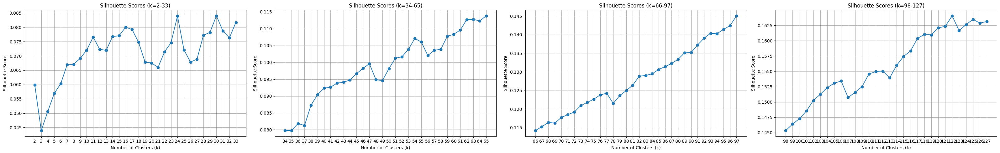

In [11]:
def plot_silhouette_scores(X, k_range):
    from sklearn.metrics import silhouette_score
    scores = []
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(X)
        score = silhouette_score(X, labels)
        scores.append(score)
        print(f"Silhouette score for k={k}: {score:.4f}")
        
    max_scores = 32
    num_plots = (len(k_range) + max_scores - 1) // max_scores

    fig, axes = plt.subplots(1, num_plots, figsize=(8 * num_plots, 5))
    if num_plots == 1:
        axes = [axes]

    for plot_idx in range(num_plots):
        start_idx = plot_idx * max_scores
        end_idx = min(start_idx + max_scores, len(k_range))
        
        k_subset = list(k_range)[start_idx:end_idx]
        score_subset = scores[start_idx:end_idx]

        axes[plot_idx].plot(k_subset, score_subset, marker='o')
        axes[plot_idx].set_title(f"Silhouette Scores (k={k_subset[0]}-{k_subset[-1]})")
        axes[plot_idx].set_xlabel("Number of Clusters (k)")
        axes[plot_idx].set_ylabel("Silhouette Score")
        axes[plot_idx].set_xticks(k_subset)
        axes[plot_idx].grid()
    plt.tight_layout()
    plt.show()
plot_silhouette_scores(X_scaled, range(2, 128))

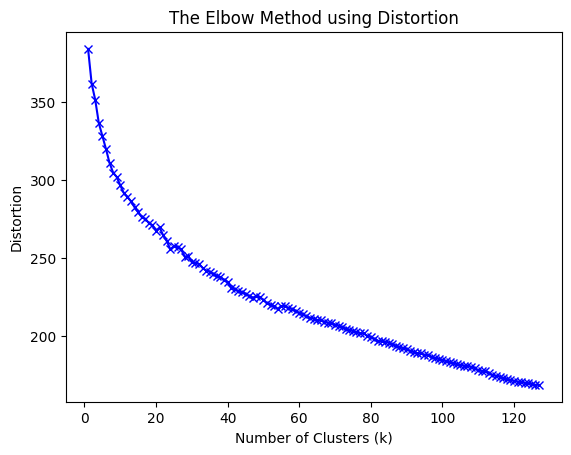

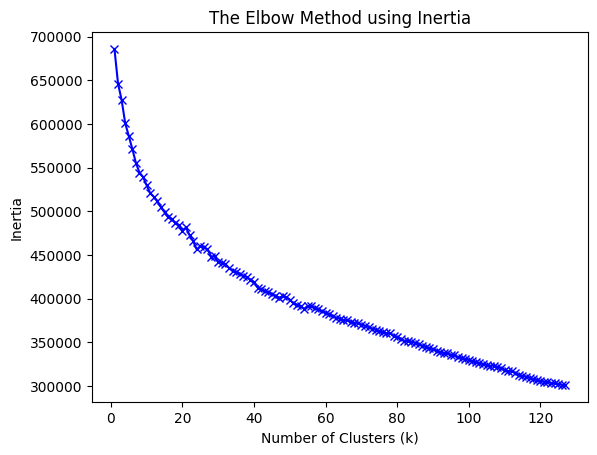

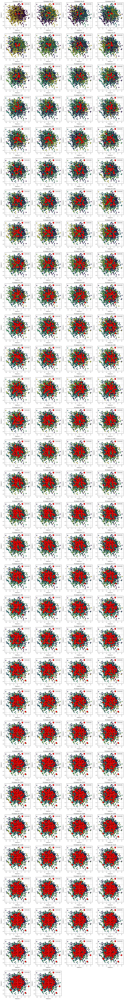

In [12]:
from scipy.spatial.distance import cdist
def plot_elbow(X, k_range):
    distortions = []
    inertias = []
    mapping1 = {}
    mapping2 = {}
    K = range(1, k_range.stop)
    for k in K:
        kmeanModel = KMeans(n_clusters=k, random_state=42)
        kmeanModel.fit(X)
        distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 'euclidean'), axis=1)**2) / X.shape[0])
        inertias.append(kmeanModel.inertia_)
        mapping1[k] = distortions[-1]
        mapping2[k] = inertias[-1]

    plt.plot(K, distortions, 'bx-')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Distortion')
    plt.title('The Elbow Method using Distortion')
    plt.show()
    plt.close()
    
    plt.plot(K, inertias, 'bx-')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Inertia')
    plt.title('The Elbow Method using Inertia')
    plt.show()
    plt.close()
    
    n_plots = len(k_range)
    n_cols = 4
    n_rows = (n_plots + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4*n_rows))
    axes = axes.flatten()
    
    for idx, k in enumerate(k_range):
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
        y_kmeans = kmeans.fit_predict(X)

        axes[idx].scatter(X[:, 0], X[:, 1], c=y_kmeans, cmap='viridis', marker='o', edgecolor='k', s=50)
        axes[idx].scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
                    s=200, c='red', label='Centroids', edgecolor='k')
        axes[idx].set_title(f'K-means (k={k})')
        axes[idx].set_xlabel('Feature 1')
        axes[idx].set_ylabel('Feature 2')
        axes[idx].legend()
        axes[idx].grid()
    
    for idx in range(n_plots, len(axes)):
        axes[idx].set_visible(False)
    
    plt.tight_layout()
    plt.show()
    plt.close()
plot_elbow(X_scaled, range(2, 128))

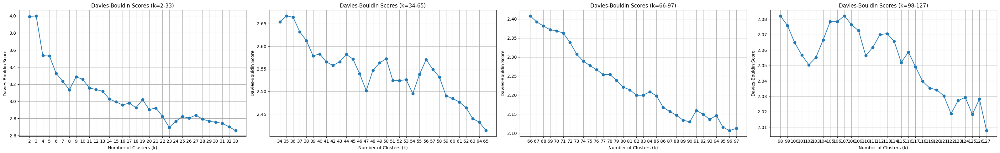

In [13]:
from sklearn.metrics import davies_bouldin_score
def davies_bouldin_scores(X, k_range):
    scores = []
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(X)
        score = davies_bouldin_score(X, labels)
        scores.append(score)
    
        
    max_scores = 32
    num_plots = (len(k_range) + max_scores - 1) // max_scores

    fig, axes = plt.subplots(1, num_plots, figsize=(8 * num_plots, 5))
    if num_plots == 1:
        axes = [axes]

    for plot_idx in range(num_plots):
        start_idx = plot_idx * max_scores
        end_idx = min(start_idx + max_scores, len(k_range))
        
        k_subset = list(k_range)[start_idx:end_idx]
        score_subset = scores[start_idx:end_idx]

        axes[plot_idx].plot(k_subset, score_subset, marker='o')
        axes[plot_idx].set_title(f"Davies-Bouldin Scores (k={k_subset[0]}-{k_subset[-1]})")
        axes[plot_idx].set_xlabel("Number of Clusters (k)")
        axes[plot_idx].set_ylabel("Davies-Bouldin Score")
        axes[plot_idx].set_xticks(k_subset)
        axes[plot_idx].grid()
    plt.tight_layout()
    plt.show()
davies_bouldin_scores(X_scaled, range(2, 128))

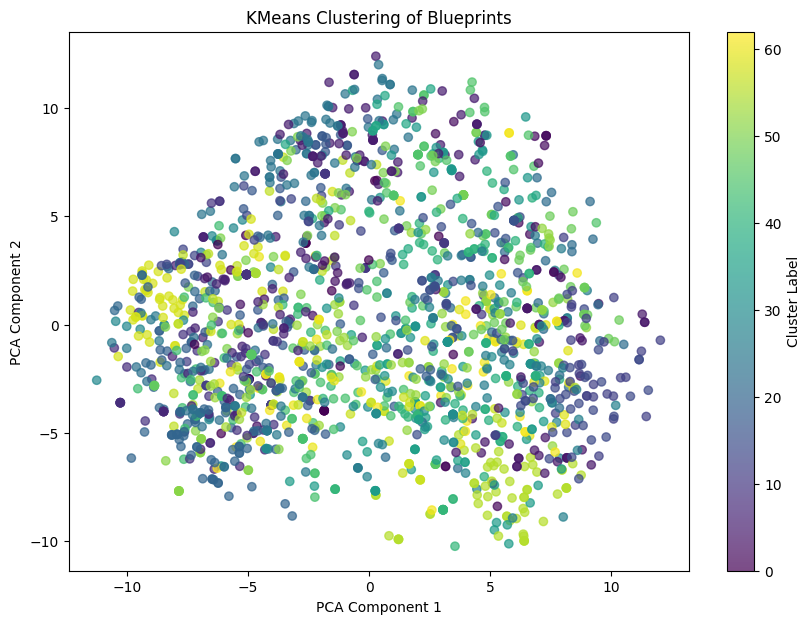

In [14]:
kmeans = KMeans(n_clusters=63, random_state=42)
bp_df["cluster"] = kmeans.fit_predict(X_scaled)

def visualize_clusters(X, labels):
    import matplotlib.pyplot as plt
    from sklearn.decomposition import PCA

    pca = PCA(n_components=2)
    X_reduced = pca.fit_transform(X)

    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=labels, cmap="viridis", alpha=0.7)
    plt.title("KMeans Clustering of Blueprints")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.colorbar(scatter, label="Cluster Label")
    plt.show()


visualize_clusters(X_scaled, bp_df["cluster"])  

In [15]:
from collections import Counter

def analyze_cluster_features(bp_df, cluster_id, top_n=10):
    """Analyze the most common features in a specific cluster"""
    cluster_data = bp_df[bp_df["cluster"] == cluster_id]
    
    all_features = []
    for features in cluster_data["features"]:
        feature_list = [f for f in features.split() if f != "<PAD>"]
        all_features.extend(feature_list)
    
    feature_counts = Counter(all_features)
    
    """ print(f"\nTop {top_n} features in Cluster {cluster_id}:")
    for feature, count in feature_counts.most_common(top_n):
        print(f"  {feature}: {count}") """
    
    return feature_counts.most_common(top_n)

for cluster_id in range(kmeans.n_clusters):
    analyze_cluster_features(bp_df, cluster_id, top_n=5)

In [16]:
from collections import Counter, defaultdict

cluster_features = defaultdict(list)
for idx, row in bp_df.iterrows():
    cluster_id = row["cluster"]
    feature_list = [f for f in row["features"].split() if f != "<PAD>"]
    cluster_features[cluster_id].extend(feature_list)

# Calculate feature frequencies per cluster
cluster_feature_counts = {}
for cluster_id, features in cluster_features.items():
    cluster_feature_counts[cluster_id] = Counter(features)

# Find features that are distinctive (appear heavily in some clusters but not others)
all_features = set()
for counts in cluster_feature_counts.values():
    all_features.update(counts.keys())

# Calculate variance in feature distribution across clusters
feature_variance = {}
for feature in all_features:
    counts = [cluster_feature_counts[c].get(feature, 0) for c in range(kmeans.n_clusters)]
    feature_variance[feature] = np.var(counts)

# Sort by variance (higher variance = more distinctive)
sorted_features = sorted(feature_variance.items(), key=lambda x: x[1], reverse=True)

print("\nTop 20 most distinctive features across clusters:")
for feature, variance in sorted_features[:20]:
    print(f"  {feature}: variance={variance:.2f}")
    cluster_presence = [(c, cluster_feature_counts[c].get(feature, 0)) 
                       for c in range(kmeans.n_clusters) 
                       if cluster_feature_counts[c].get(feature, 0) > 0]
    cluster_presence.sort(key=lambda x: x[1], reverse=True)
    print(f"    Most common in clusters: {cluster_presence[:3]}")


Top 20 most distinctive features across clusters:
  switch: variance=235.13
    Most common in clusters: [(14, 72), (48, 64), (12, 55)]
  lights: variance=150.66
    Most common in clusters: [(5, 67), (24, 66), (2, 23)]
  button: variance=147.87
    Most common in clusters: [(55, 58), (52, 41), (4, 37)]
  light: variance=136.92
    Most common in clusters: [(5, 69), (24, 58), (45, 20)]
  remote: variance=134.10
    Most common in clusters: [(4, 65), (52, 64), (61, 19)]
  press: variance=114.77
    Most common in clusters: [(55, 70), (30, 46), (15, 15)]
  notification: variance=98.14
    Most common in clusters: [(20, 67), (23, 31), (7, 25)]
  input__binary_sensor: variance=97.70
    Most common in clusters: [(24, 63), (56, 29), (23, 26)]
  battery: variance=94.97
    Most common in clusters: [(46, 78), (40, 2), (12, 1)]
  zigbee: variance=82.69
    Most common in clusters: [(55, 46), (12, 41), (4, 36)]
  motion: variance=81.20
    Most common in clusters: [(24, 72), (17, 6), (56, 3)]


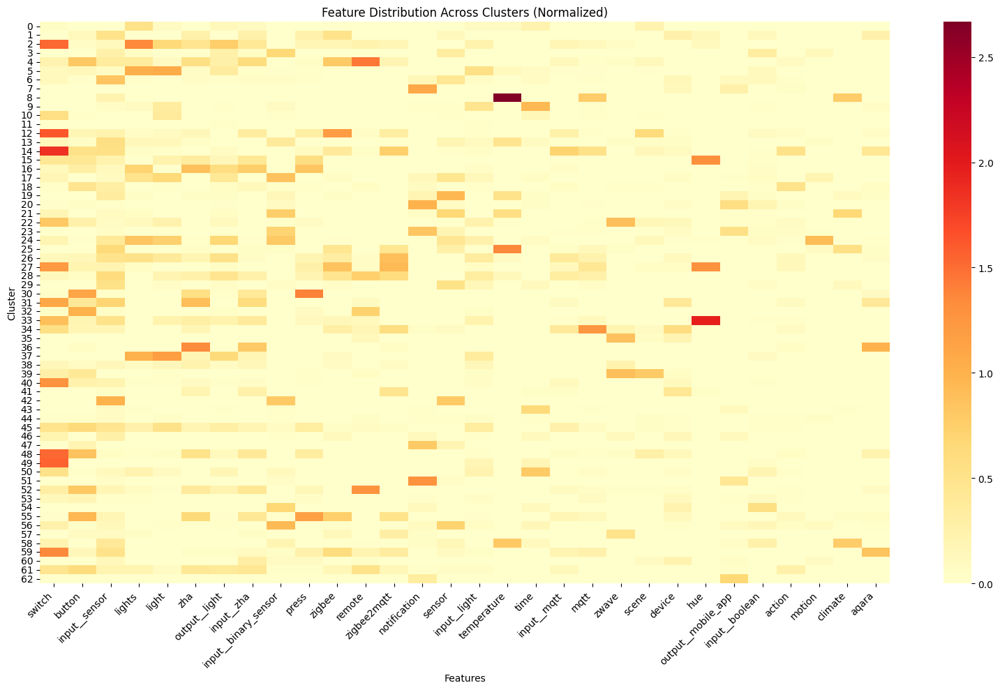

In [18]:
import seaborn as sns

# Get top features overall
all_feature_counts = Counter()
for features in bp_df["features"]:
    feature_list = [f for f in features.split() if f != "<PAD>"]
    all_feature_counts.update(feature_list)

top_features = [f for f, _ in all_feature_counts.most_common(30)]

# Create matrix: clusters x features
matrix = np.zeros((kmeans.n_clusters, len(top_features)))
for cluster_id in range(kmeans.n_clusters):
    cluster_counts = cluster_feature_counts[cluster_id]
    for i, feature in enumerate(top_features):
        matrix[cluster_id, i] = cluster_counts.get(feature, 0)

# Normalize by cluster size
cluster_sizes = bp_df["cluster"].value_counts().sort_index()
matrix = matrix / cluster_sizes.values[:, np.newaxis]

# Plot heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(matrix, xticklabels=top_features, yticklabels=range(kmeans.n_clusters), 
            cmap='YlOrRd', annot=False)
plt.title("Feature Distribution Across Clusters (Normalized)")
plt.xlabel("Features")
plt.ylabel("Cluster")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [20]:
def write_to_md(filename: str):    
    with open(filename, "w", encoding="utf-8") as f:
        for cluster_id in range(kmeans.n_clusters):
            f.write(f"<details>\n")
            features = analyze_cluster_features(bp_df, cluster_id, top_n=5)
            f.write(f"<summary> Cluster {cluster_id} </summary>\n\n")
            f.write(f"Top 5 features: \n")
            for feature, count in features:
                f.write(f"- {feature}: {count} \n")
            f.write("\n")
            bps = bp_df[bp_df["cluster"] == cluster_id]
            for idx, bp in bps.iterrows():
                post_url = topics_df[topics_df["post_id"] == bp["post_id"]]["post_url"].values[0]
                f.write(f"{bp['name']}, {post_url} \n\n")
            f.write(f"</details>\n\n")
c_name = "clusters_63"
write_to_md(f"output/{c_name}.md")

In [21]:
bp_df.to_pickle(f"output/bp_{c_name}.pkl")

In [26]:
import torch
torch.cuda.get_device_name(0)

'NVIDIA GeForce RTX 3070'